In [1]:
%matplotlib inline

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu
import seaborn as sns
from matplotlib.gridspec import GridSpec
import scanpy as sc
import muon as mu
import graphtools
import magic
from matplotlib.pyplot import rc_context
from matplotlib import gridspec
import os


from datashader.mpl_ext import dsshow
import datashader as ds

import matplotlib.colors
cmap = plt.cm.hsv
cmaplist = [cmap(i) for i in range(cmap.N)]
cmaplist = cmaplist[0:round(len(cmaplist)*0.7)]
cmaplist.reverse()
cmap = matplotlib.colors.LinearSegmentedColormap.from_list('', cmaplist, cmap.N)

import matplotlib.patches as mpatches
import matplotlib.pyplot as plt

import sys
sys.path.append('../../../Code/')
from utils import read_dataset_log


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from matplotlib import rcParams, font_manager
import matplotlib


rcParams['pdf.fonttype'] = 42
rcParams['ps.fonttype'] = 42
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Arial']

In [3]:
params = read_dataset_log('Dataset Paths')
params.index = params['dataset']
params

,dataset,usage_fn,gene_scores_fn,gene_tpm_fn,tcat_fn,tcat_fn_withsingletons,manual_gating_fn,manual_activation_gating_fn,activation_score_fn,metadata_fn,...,cnmf_dir,k,dt,processed_forcnmf_fn,tpm_counts_for_cnmf_fn,raw_counts_filt_fn,raw_counts_fn,dataset_type,tissue_type,context_label
dataset,,,,,,,,,,,,,,,,,,,,,
AMP-RA,AMP-RA,/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMPRA....,/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMPRA....,/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMPRA....,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,NaN,NaN,/data/srlab1/TCAT/Data/PerDataset/AMPRA/Activa...,/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMP_AD...,...,/data/srlab1/TCAT/Data/PerDataset/AMPRA,34.0,0_15,/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMP_AD...,/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMP_AD...,/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMP_AD...,/data/srlab1/TCAT/Data/PerDataset/AMPRA/AMP_AD...,discovery,Synovium,RA+OA
Pan-Cancer,Pan-Cancer,/data/srlab1/TCAT/Data/PerDataset/Pancancer/Pa...,/data/srlab1/TCAT/Data/PerDataset/Pancancer/Pa...,/data/srlab1/TCAT/Data/PerDataset/Pancancer/Pa...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,NaN,NaN,/data/srlab1/TCAT/Data/PerDataset/Pancancer/Ac...,/data/srlab1/TCAT/Data/PerDataset/Pancancer/pa...,...,/data/srlab1/TCAT/Data/PerDataset/Pancancer,38.0,0.15,/data/srlab1/TCAT/Data/PerDataset/Pancancer/pa...,NaN,/data/srlab1/TCAT/Data/PerDataset/Pancancer/pa...,/data/srlab1/TCAT/Data/PerDataset/Pancancer/pa...,discovery,Pan-Tissue,Cancer+Healthy
TBRU,TBRU,/data/srlab1/TCAT/Data/PerDataset/TBRU/TBRU.20...,/data/srlab1/TCAT/Data/PerDataset/TBRU/TBRU.20...,/data/srlab1/TCAT/Data/PerDataset/TBRU/TBRU.20...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,NaN,NaN,/data/srlab1/TCAT/Data/PerDataset/TBRU/Activat...,/data/srlab1/TCAT/Data/PerDataset/TBRU/tbru_ex...,...,/data/srlab1/TCAT/Data/PerDataset/TBRU,36.0,0_20,/data/srlab1/TCAT/Data/PerDataset/TBRU/tbru_ex...,/data/srlab1/TCAT/Data/PerDataset/TBRU/tbru_ex...,/data/srlab1/TCAT/Data/PerDataset/TBRU/tbru_ex...,/data/srlab1/TCAT/Data/PerDataset/TBRU/tbru_ex...,discovery,Blood,Healthy
HIV-Vaccine,HIV-Vaccine,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/HIVV...,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/HIVV...,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/HIVV...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/Manu...,NaN,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/Acti...,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/haoe...,...,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl,31.0,0_15,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/haoe...,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/haoe...,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/haoe...,/data/srlab1/TCAT/Data/PerDataset/HaoEtAl/haoe...,discovery,Blood,Post-Vaccine+Healthy
UK-Covid,UK-Covid,/data/srlab1/TCAT/Data/PerDataset/UKCOVID/UKCO...,/data/srlab1/TCAT/Data/PerDataset/UKCOVID/UKCO...,/data/srlab1/TCAT/Data/PerDataset/UKCOVID/UKCO...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,NaN,NaN,/data/srlab1/TCAT/Data/PerDataset/UKCOVID/Acti...,/data/srlab1/TCAT/Data/PerDataset/UKCOVID/hani...,...,/data/srlab1/TCAT/Data/PerDataset/UKCOVID,44.0,0_20,/data/srlab1/TCAT/Data/PerDataset/UKCOVID/hani...,NaN,/data/srlab1/TCAT/Data/PerDataset/UKCOVID/hani...,/data/srlab1/TCAT/Data/PerDataset/UKCOVID/hani...,discovery,Blood,Covid-19+Healthy
COMBAT,COMBAT,/data/srlab1/TCAT/Data/PerDataset/COMBAT/COMBA...,/data/srlab1/TCAT/Data/PerDataset/COMBAT/COMBA...,/data/srlab1/TCAT/Data/PerDataset/COMBAT/COMBA...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,/data/srlab1/TCAT/Data/TCAT/TCAT_Usage.2023101...,/data/srlab1/TCAT/Data/PerDataset/COMBAT/Manua...,/data/srlab1/TCAT/Data/PerDataset/COMBAT/Manua...,/data/srlab1/TCAT/Data/PerDataset/COMBAT/Activ...,/data/

# Prepare markers

In [ ]:
# raw_counts_fn = '/data/srlab1/TCAT/Data/PerDataset/COMBAT/COMBAT-CITESeq-DATA.Raw.T.ADTfixed.h5ad'

In [4]:
outdir = '../../../Data/PerDataset/UKCOVID'

In [42]:
figdir = '../../../Figures/Components'

In [5]:
outfn = os.path.join(outdir, 'ADT_TP10KCLR_ForMAGIC.h5ad')
print(outfn)

../../../Data/PerDataset/UKCOVID/ADT_TP10KCLR_ForMAGIC.h5ad


In [6]:
adata_ADT = sc.read(outfn)

In [73]:
adata_ADT.var['ADT_MI_Rank'].sort_values()

Name_ADT_Fixed
AB_CLEC12A                     0.0
AB_CD35                        1.0
AB_CD5                         2.0
AB_CD3-1                       3.0
AB_CD32                        4.0
                             ...  
AB_HLA_F                     187.0
AB_CD66a/c/e                 188.0
AB_CD257                     189.0
AB_HLA_A2                    190.0
AB_IgG2bisotypectrl_mouse    191.0
Name: ADT_MI_Rank, Length: 192, dtype: float64

In [ ]:
set(rna_markers) - set(adata_RNA.var.index)

In [8]:
adt_markers = ['AB_CD25',
               'AB_CD38-1', 'AB_CD279', 'AB_CD54', 'AB_CD69', 'AB_CD71', 'AB_CD274',
              'AB_CD95'
              ]
    
#     'AB_CD3-1', 'AB_CD4-2',
#                'AB_CD8', 'AB_CD45RA', 'AB_CD45RO',  'AB_CD18', 'AB_CD161',  'AB_CD194', 'AB_CD195', 'AB_CD196', 'AB_CXCR3',
#                'AB_CD25', 'AB_CD127', 
#                'AB_CD27-1',
#                'AB_TCR-Vd2', 'AB_TCR-V-7.2', 'AB_TCR-V-9', 'AB_abTCR', 'AB_gdTCR',
#                'AB_CD31', 'AB_CD62L', 'AB_CCR7',
#                'AB_CD314',
#                'AB_CD38-1', 'AB_CD39',
#               'AB_CD94', 'AB_CD49b', 'AB_CD28'
              # ] 
    

In [7]:
sorted(adata_ADT.var.index)

['AB_B7-H4',
 'AB_CCR3',
 'AB_CCR7',
 'AB_CD10',
 'AB_CD101',
 'AB_CD103',
 'AB_CD106',
 'AB_CD107a',
 'AB_CD112',
 'AB_CD117',
 'AB_CD11a',
 'AB_CD11b-1',
 'AB_CD11c',
 'AB_CD122',
 'AB_CD123',
 'AB_CD124',
 'AB_CD127',
 'AB_CD133-2',
 'AB_CD137',
 'AB_CD137L',
 'AB_CD138-2',
 'AB_CD14-1',
 'AB_CD141',
 'AB_CD144',
 'AB_CD146',
 'AB_CD15',
 'AB_CD150',
 'AB_CD152',
 'AB_CD154',
 'AB_CD155',
 'AB_CD158',
 'AB_CD158b',
 'AB_CD158e1',
 'AB_CD158f',
 'AB_CD16',
 'AB_CD161',
 'AB_CD163',
 'AB_CD169',
 'AB_CD178',
 'AB_CD18',
 'AB_CD184',
 'AB_CD185',
 'AB_CD19',
 'AB_CD194',
 'AB_CD195',
 'AB_CD196',
 'AB_CD1a',
 'AB_CD1c',
 'AB_CD1d',
 'AB_CD2',
 'AB_CD20',
 'AB_CD204',
 'AB_CD206',
 'AB_CD207',
 'AB_CD209',
 'AB_CD21',
 'AB_CD22',
 'AB_CD223',
 'AB_CD224',
 'AB_CD226-2',
 'AB_CD23',
 'AB_CD235ab',
 'AB_CD24',
 'AB_CD244',
 'AB_CD25',
 'AB_CD252',
 'AB_CD254',
 'AB_CD257',
 'AB_CD258',
 'AB_CD26',
 'AB_CD267',
 'AB_CD268',
 'AB_CD269',
 'AB_CD27-1',
 'AB_CD272',
 'AB_CD273',
 'AB_CD274',


In [9]:
set(adt_markers) - set(adata_ADT.var.index)

set()

## Check marker quality

In [81]:
raw_counts_fn = params.loc[dataset, 'raw_counts_fn']
raw_counts_fn

'/data/srlab1/TCAT/Data/PerDataset/UKCOVID/haniffa21.RNAandADT.raw.ADTfixed.h5ad'

In [82]:
adata_raw = sc.read(raw_counts_fn)

Only considering the two last: ['.ADTfixed', '.h5ad'].
Only considering the two last: ['.ADTfixed', '.h5ad'].


In [84]:
ind = adata_raw.var['feature_types']=='Antibody Capture'

In [85]:
adata_ADT_raw = adata_raw[:,ind].copy()

In [91]:
adata_ADT_raw.X.todense().shape

(612982, 192)

In [97]:
x = np.sum(adata_ADT_raw.X.todense(), axis = 0)

In [104]:
adata_ADT_raw.var['Num_Counts'] = x.tolist()[0]

In [109]:
adata_ADT_raw.var['Mean_Counts'] = adata_ADT_raw.var['Num_Counts']/adata_ADT_raw.shape[0]

In [107]:
adata_ADT_raw.shape[0]

612982

In [114]:
adata_ADT_raw.var.sort_values('Mean_Counts', ascending = False).index.tolist()

['AB_CD41',
 'AB_Podoplanin',
 'AB_CD5',
 'AB_CD138-2',
 'AB_mouseCD49f',
 'AB_CD58',
 'AB_CD45RA',
 'AB_CD226-2',
 'AB_gdTCR',
 'AB_CD30',
 'AB_CD107a',
 'AB_CD326',
 'AB_CD11b-1',
 'AB_CD70',
 'AB_CD35',
 'AB_CD269',
 'AB_CD154',
 'AB_CD336',
 'AB_CD303',
 'AB_B7-H4',
 'AB_TCR-V-24-J-18',
 'AB_CD52',
 'AB_CD4-2',
 'AB_CD99',
 'AB_humanMac_2_Galectin_3',
 'AB_Iglightchaink',
 'AB_CD95',
 'AB_CD169',
 'AB_CD96',
 'AB_IgGFc',
 'AB_CD223',
 'AB_CD124',
 'AB_TCR_Vb13_1',
 'AB_CLEC12A',
 'AB_Iglightchainl',
 'AB_XCR1',
 'AB_CD144',
 'AB_CD254',
 'AB_CD62P',
 'AB_CD32',
 'AB_CD69',
 'AB_CCR7',
 'AB_CD45RO',
 'AB_abTCR',
 'AB_CD307d',
 'AB_CD66b',
 'AB_CD158f',
 'AB_CD305',
 'AB_CD279',
 'AB_CD3-1',
 'AB_CX3CR1',
 'AB_TIGIT',
 'AB_CD88',
 'AB_CD324',
 'AB_CD54',
 'AB_CD47',
 'AB_CD357',
 'AB_CD257',
 'AB_CD337',
 'AB_CD204',
 'AB_CD45-2',
 'AB_CD224',
 'AB_CXCR3',
 'AB_NLRP2',
 'AB_HLA-DR',
 'AB_TauPhospho_Thr181',
 'AB_CD62L',
 'AB_CD1c',
 'AB_TCR-V-9',
 'AB_CD24',
 'AB_CD150',
 'AB_CD49d',

In [75]:
adata_ADT.var.loc[adt_markers, :].sort_values('ADT_MI_Rank')

,feature_types,ADT_MI,ADT_MI_Rank,IEG_Filter,IEG_GEP_Score,Name,Name_ADT_Fixed,Gene_ADT_Fixed,Clone_ADT_Fixed,mean,std
Name_ADT_Fixed,,,,,,,,,,,
AB_CD38-1,Antibody Capture,0.221215,19.0,False,NaN,AB_CD38,AB_CD38-1,CD38_1,HIT2,0.944067,0.574130
AB_CD54,Antibody Capture,0.207280,23.0,False,NaN,AB_ICAM1,AB_CD54,CD54,HA58,1.111883,0.527804
AB_CD95,Antibody Capture,0.148988,37.0,False,NaN,AB_FAS,AB_CD95,CD95,DX2,1.515551,0.436004
AB_CD71,Antibody Capture,0.101539,52.0,False,NaN,AB_CD71,AB_CD71,CD71,CY1G4,0.523651,0.476058
AB_CD69,Antibody Capture,0.049395,89.0,False,NaN,AB_CD69,AB_CD69,CD69,FN50,1.166559,0.447364
AB_CD25,Antibody Capture,0.032935,103.0,False,NaN,AB_CD25,AB_CD25,CD25,BC96,0.281024,0.252892
AB_CD279,Antibody Capture,0.031632,106.0,False,NaN,AB_PD1,AB_CD279,CD279,EH12.2H7,1.406784,0.416555
AB_CD274,Antibody Capture,0.014578,134.0,False,NaN,AB_CD274,AB_CD274,CD274,29E.2A3,0.538087,0.300051


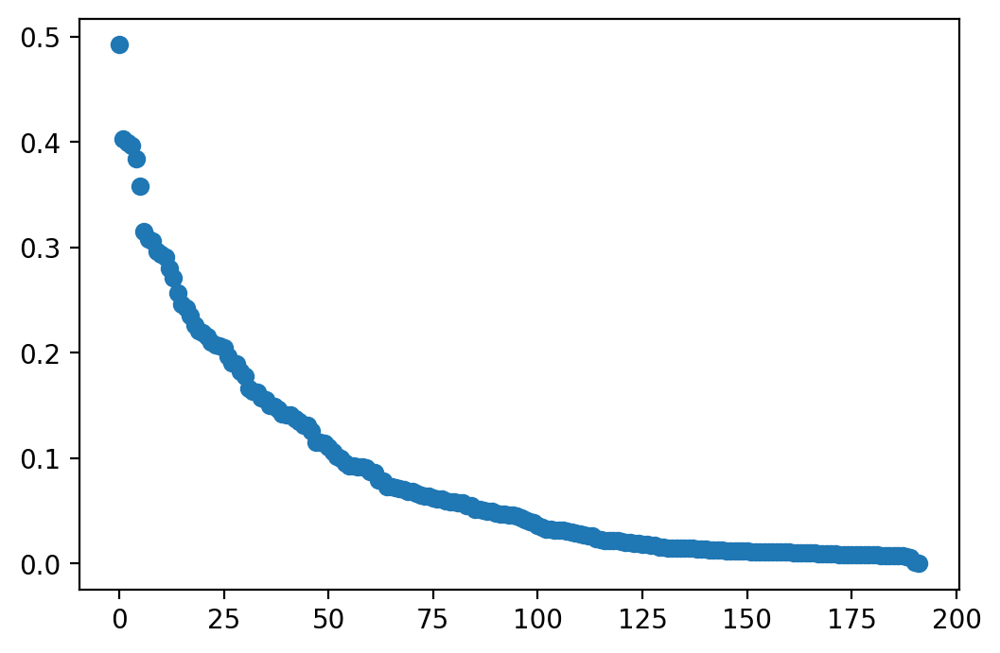

In [115]:
fig, ax = plt.subplots(dpi =200)
ax.scatter(x = adata_ADT.var['ADT_MI_Rank'], y = adata_ADT.var['ADT_MI'])

In [117]:
adt_markers = [ 'AB_CD38-1', 'AB_CD54', 'AB_CD71', 'AB_CD95'
              ]
    
#     'AB_CD3-1', 'AB_CD4-2',
#                'AB_CD8', 'AB_CD45RA', 'AB_CD45RO',  'AB_CD18', 'AB_CD161',  'AB_CD194', 'AB_CD195', 'AB_CD196', 'AB_CXCR3',
#                'AB_CD25', 'AB_CD127', 
#                'AB_CD27-1',
#                'AB_TCR-Vd2', 'AB_TCR-V-7.2', 'AB_TCR-V-9', 'AB_abTCR', 'AB_gdTCR',
#                'AB_CD31', 'AB_CD62L', 'AB_CCR7',
#                'AB_CD314',
#                'AB_CD38-1', 'AB_CD39',
#               'AB_CD94', 'AB_CD49b', 'AB_CD28'
              # ] 
    

In [118]:
G = graphtools.Graph(data=adata_ADT.obsp['connectivities'], precomputed='affinity')
magic_operator = magic.MAGIC(t=3)
magic_operator.fit(adata_ADT.X, graph=G)
markers_magic_adt = magic_operator.transform(X=adata_ADT[:, adt_markers].X)
markers_magic_adt = pd.DataFrame(markers_magic_adt, index=adata_ADT.obs.index, columns=adt_markers)

Running MAGIC on 612982 cells and 192 genes.
Using precomputed graph and diffusion operator...


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/graphtools/base.py:554: RuntimeWarning: K should have a non-zero diagonal
  warnings.warn("K should have a non-zero diagonal", RuntimeWarning)


Calculating imputation...


/PHShome/mc1070/.local/lib/python3.7/site-packages/magic/magic.py:546: UserWarning: Running MAGIC.transform on different data to that which was used for MAGIC.fit may not produce sensible output, unless it comes from the same manifold.
  UserWarning,


Calculated imputation in 0.23 seconds.


In [119]:
markers_magic_adt

,AB_CD38-1,AB_CD54,AB_CD71,AB_CD95
covid_index,,,,
AAACCTGAGAAACCTA-MH9179824,1.506425,2.178933,1.043553,3.766357
AAACCTGAGAGTAATC-MH9179824,1.006063,1.752153,1.058274,3.965970
AAACCTGAGAGTGAGA-MH9179824,0.819773,1.797746,0.837427,5.243146
AAACCTGAGGAATCGC-MH9179824,1.065072,1.824304,0.998068,4.658369
AAACCTGAGTGTTGAA-MH9179824,1.211049,2.043572,0.845928,4.838717
...,...,...,...,...
BGCV15_TTTGGTTTCAAGATCC-1,2.491346,2.438677,0.673148,4.433408
BGCV15_TTTGTCACAAGCCATT-1,2.466978,1.780300,0.707251,3.127223
BGCV15_TTTGTCACAGACACTT-1,1.115183,2.162546,0.869598,3.784923


In [120]:
markers_magic = markers_magic_adt

In [125]:
outfn = os.path.join(outdir, 'MagicMarker.ActivationOnly.ADT_CLRTP10K.tsv')
print(outfn)

../../../Data/PerDataset/UKCOVID/MagicMarker.ActivationOnly.ADT_CLRTP10K.tsv


In [126]:
markers_magic.to_csv(outfn, sep='\t')

In [127]:
unsmoothed_markers = pd.DataFrame(np.array(adata_ADT[:, adt_markers].X), 
                                  index=adata_ADT.obs.index,
                         columns=adt_markers)



In [128]:
outfn = os.path.join(outdir, 'UnsmoothedMarker.ActivationOnly.ADT_CLRTP10K.tsv')
print(outfn)

../../../Data/PerDataset/UKCOVID/UnsmoothedMarker.ActivationOnly.ADT_CLRTP10K.tsv


In [129]:
unsmoothed_markers.to_csv(outfn, sep='\t')

# Gate on markers

In [19]:
markers_magic = pd.read_csv(os.path.join(outdir, 'MagicMarker.ActivationOnly.ADT_CLRTP10K.tsv'), 
                            index_col = 0, sep = '\t'
                           )

In [ ]:
unsmoothed_markers = pd.read_csv(os.path.join(outdir, 'UnsmoothedMarker.ActivationOnly.ADT_CLRTP10K.tsv'), 
                            index_col = 0, sep = '\t'
                           )

## All cells

In [22]:
dataset = 'UK-Covid'

In [20]:
from scipy.stats import pearsonr
from scipy.stats import spearmanr

In [ ]:
markers_magic.columns

AB_CD95 AB_CD95
AB_CD95 AB_CD38-1
AB_CD95 AB_CD279
AB_CD95 AB_CD25
AB_CD95 AB_CD274
AB_CD95 AB_CD69
AB_CD95 AB_CD54
AB_CD95 AB_CD71
AB_CD38-1 AB_CD95
AB_CD38-1 AB_CD38-1
AB_CD38-1 AB_CD279
AB_CD38-1 AB_CD25
AB_CD38-1 AB_CD274
AB_CD38-1 AB_CD69
AB_CD38-1 AB_CD54
AB_CD38-1 AB_CD71
AB_CD279 AB_CD95
AB_CD279 AB_CD38-1
AB_CD279 AB_CD279
AB_CD279 AB_CD25
AB_CD279 AB_CD274
AB_CD279 AB_CD69
AB_CD279 AB_CD54
AB_CD279 AB_CD71
AB_CD25 AB_CD95
AB_CD25 AB_CD38-1
AB_CD25 AB_CD279
AB_CD25 AB_CD25
AB_CD25 AB_CD274
AB_CD25 AB_CD69
AB_CD25 AB_CD54


/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == "":


AB_CD25 AB_CD71
AB_CD274 AB_CD95
AB_CD274 AB_CD38-1
AB_CD274 AB_CD279
AB_CD274 AB_CD25
AB_CD274 AB_CD274
AB_CD274 AB_CD69
AB_CD274 AB_CD54
AB_CD274 AB_CD71
AB_CD69 AB_CD95
AB_CD69 AB_CD38-1
AB_CD69 AB_CD279
AB_CD69 AB_CD25
AB_CD69 AB_CD274
AB_CD69 AB_CD69
AB_CD69 AB_CD54
AB_CD69 AB_CD71
AB_CD54 AB_CD95
AB_CD54 AB_CD38-1
AB_CD54 AB_CD279
AB_CD54 AB_CD25
AB_CD54 AB_CD274
AB_CD54 AB_CD69
AB_CD54 AB_CD54
AB_CD54 AB_CD71


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


AB_CD71 AB_CD95
AB_CD71 AB_CD38-1
AB_CD71 AB_CD279
AB_CD71 AB_CD25
AB_CD71 AB_CD274
AB_CD71 AB_CD69
AB_CD71 AB_CD54
AB_CD71 AB_CD71


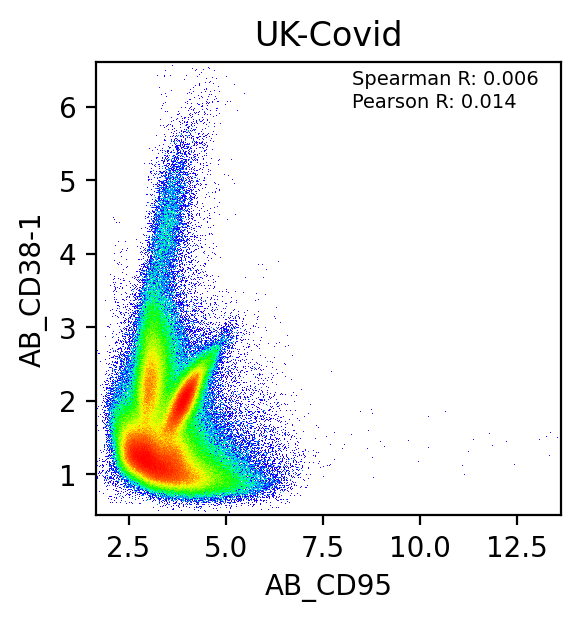

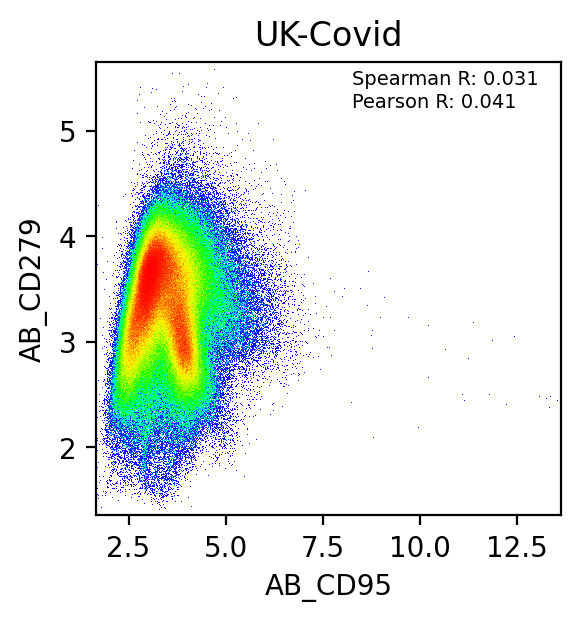

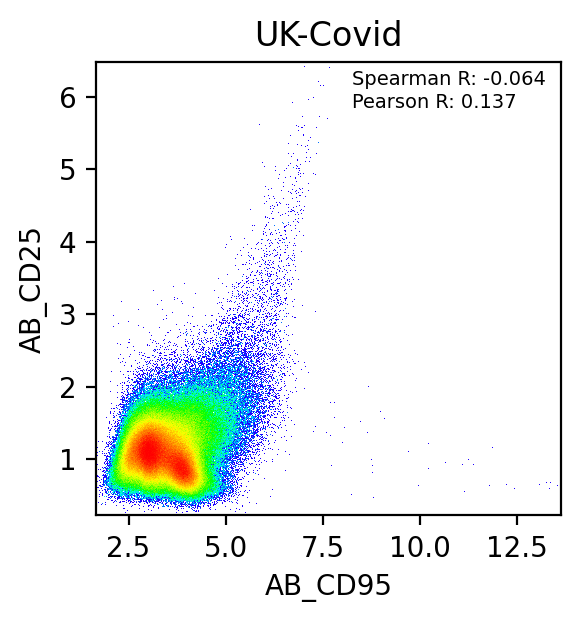

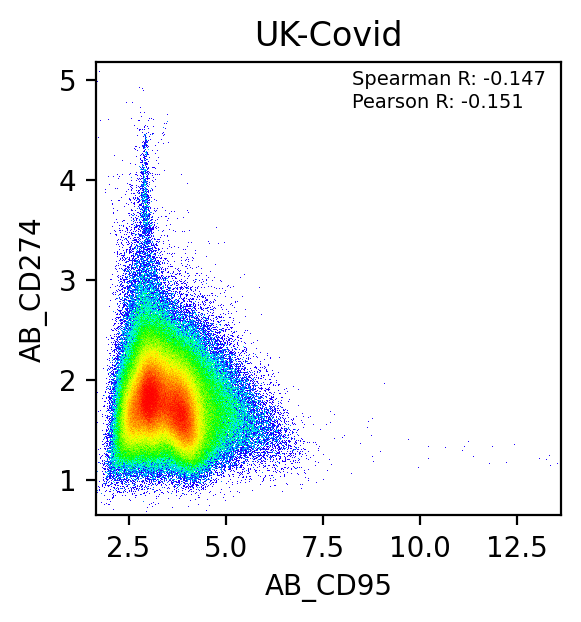

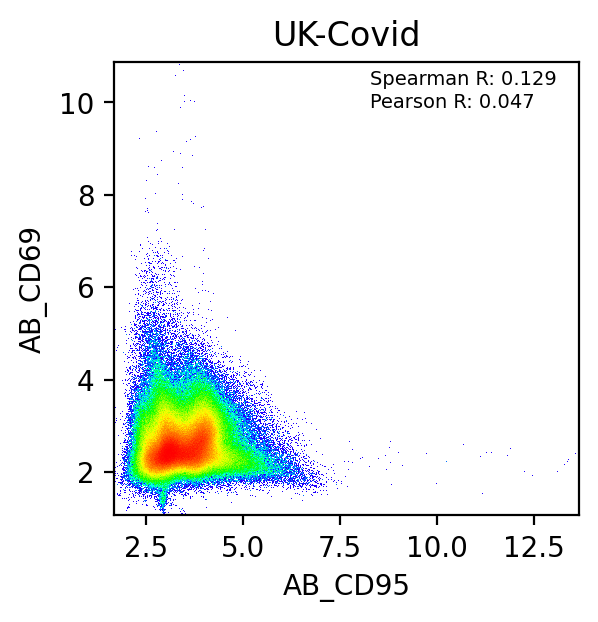

...

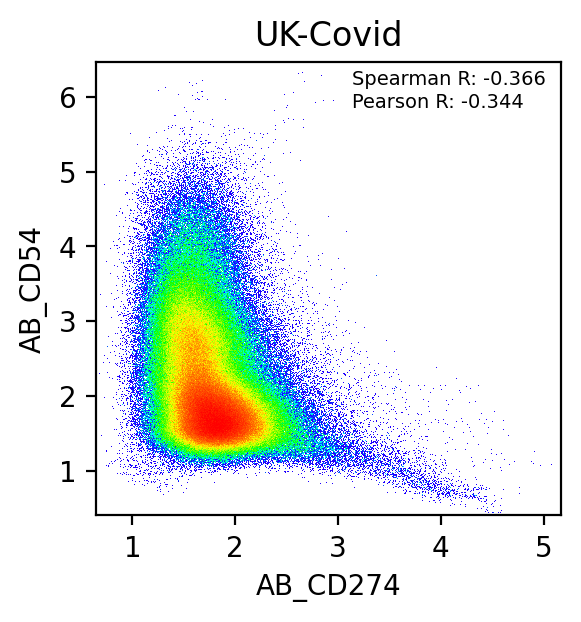

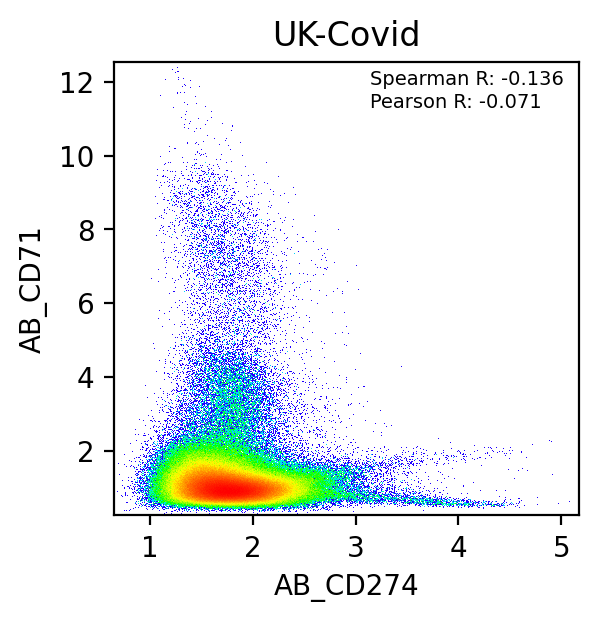

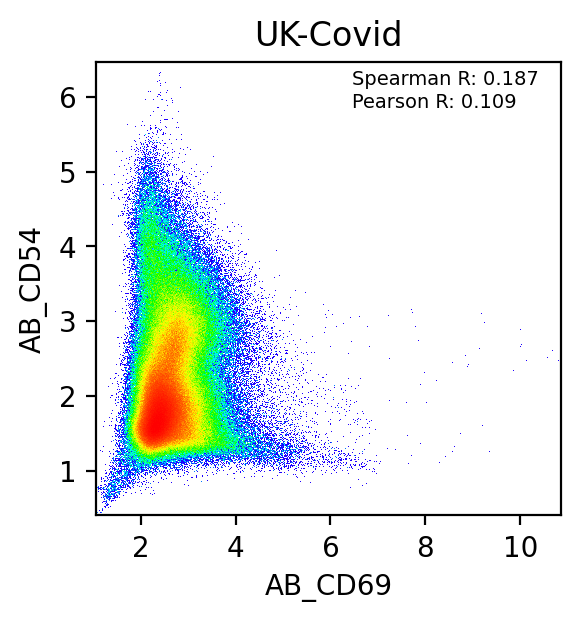

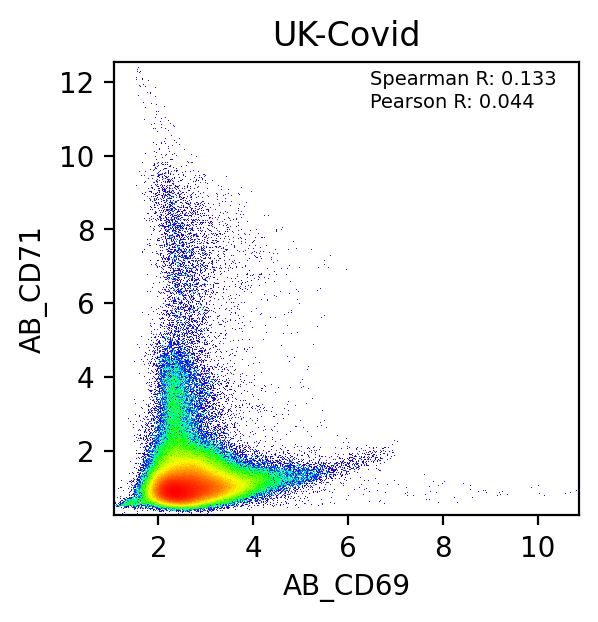

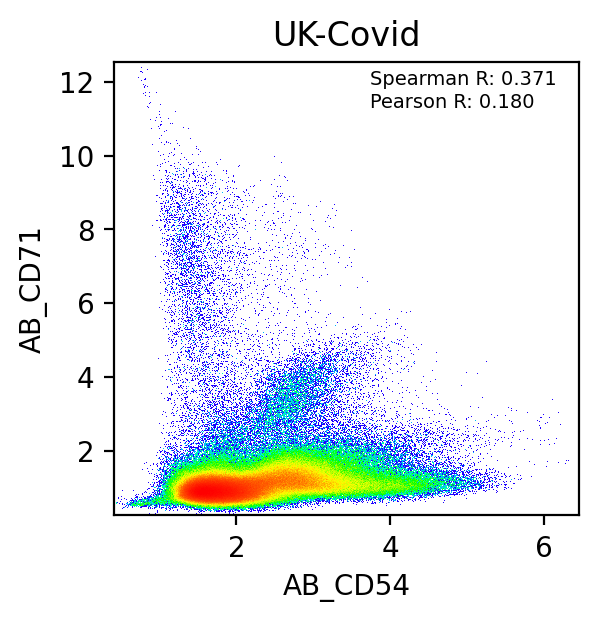

In [23]:

for i, p1 in enumerate(markers_magic.columns):
    
    for j, p2 in enumerate(markers_magic.columns):
        print(p1, p2)
        if j > i:
            x = markers_magic[p1]
            y = markers_magic[p2]
            
            r_p, _ = pearsonr(x, y)
            r_s, _ = spearmanr(x, y)

            fig, ax = plt.subplots(dpi = 200, figsize = (3, 3))
            # ax.scatter(x, y)
            dsshow(pd.DataFrame({'x':x, 'y':y}), 
                   ds.Point('x', 'y'), norm='eq_hist', cmap=cmap, ax = ax, aspect = 'auto')
            # ax.scatter(x = x, y = y, s = 0.5, edgecolors='none',)
            ax.text(x = .55, y = .95, s = 'Spearman R: %.3f' % r_s, fontsize = 7, transform=ax.transAxes)
            ax.text(x = .55, y = .9, s = 'Pearson R: %.3f' % r_p, fontsize = 7, transform=ax.transAxes)
            ax.set_xlabel(p1)
            ax.set_ylabel(p2)
            ax.set_title(dataset)

0 AB_CD38-1
0 AB_CD38-1
1 AB_CD38-1
2 AB_CD38-1
3 AB_CD38-1
1 AB_CD54
1 AB_CD54
2 AB_CD54
3 AB_CD54
2 AB_CD71
2 AB_CD71
3 AB_CD71
3 AB_CD95
3 AB_CD95


Text(0.5, 0.9, 'UK-Covid')

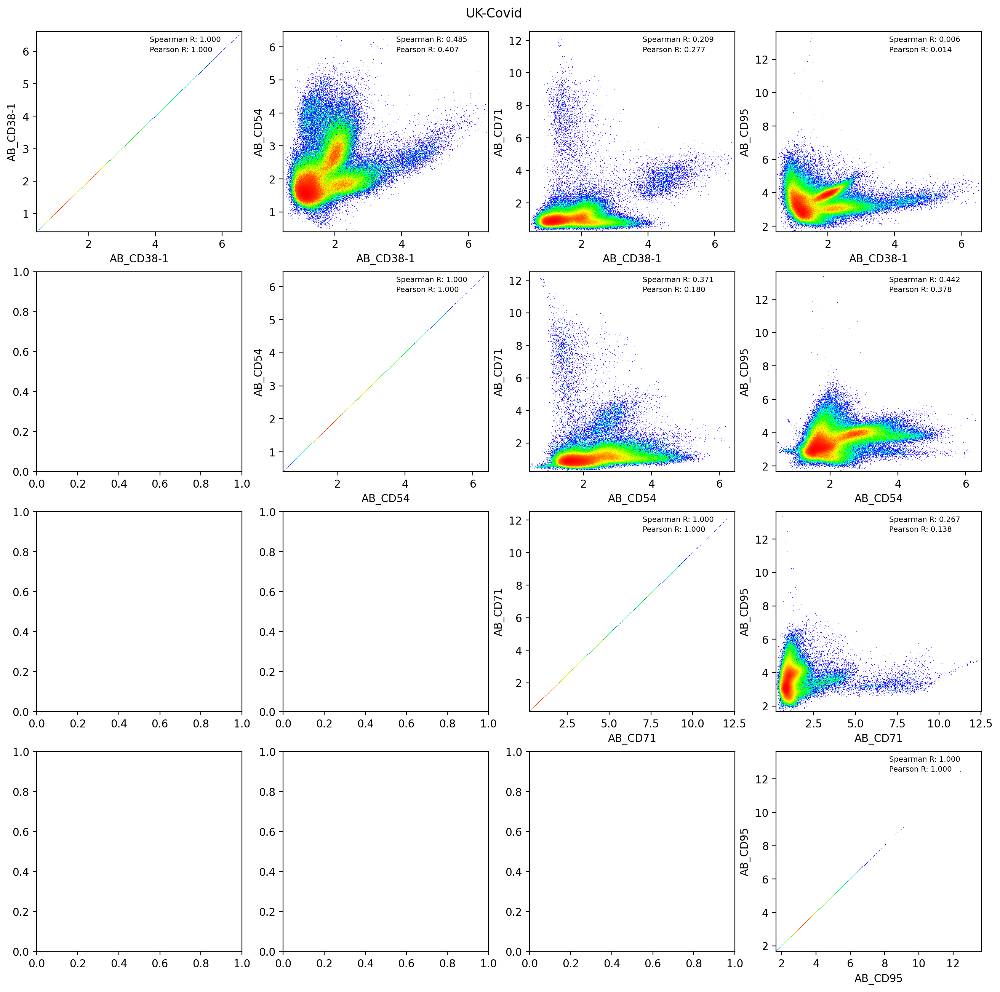

In [121]:
nrows = len(markers_magic.columns)
ncols = len(markers_magic.columns)
fig, axes = plt.subplots(dpi = 200, figsize = (4*len(markers_magic.columns), 4*len(markers_magic.columns)),
                                               nrows = nrows, ncols = ncols)

for i, p1 in enumerate(markers_magic.columns):
    print(i, p1)
    # i = i-1
    
    for j, p2 in enumerate(markers_magic.columns):
        # j = j-1
        if j >= i:
            print(j, p1)
            ax = axes[i, j]
            x = markers_magic[p1]
            y = markers_magic[p2]
            
            r_p, _ = pearsonr(x, y)
            r_s, _ = spearmanr(x, y)

            # ax.scatter(x, y)
            dsshow(pd.DataFrame({'x':x, 'y':y}), 
                   ds.Point('x', 'y'), norm='eq_hist', cmap=cmap, ax = ax, aspect = 'auto')
            # ax.scatter(x = x, y = y, s = 0.5, edgecolors='none',)
            ax.text(x = .55, y = .95, s = 'Spearman R: %.3f' % r_s, fontsize = 7, transform=ax.transAxes)
            ax.text(x = .55, y = .9, s = 'Pearson R: %.3f' % r_p, fontsize = 7, transform=ax.transAxes)
            ax.set_xlabel(p1)
            ax.set_ylabel(p2)
plt.suptitle(dataset,y = 0.9)

0 AB_CD38-1
0 AB_CD38-1
1 AB_CD38-1
2 AB_CD38-1
3 AB_CD38-1
1 AB_CD54
1 AB_CD54
2 AB_CD54
3 AB_CD54
2 AB_CD71
2 AB_CD71
3 AB_CD71
3 AB_CD95
3 AB_CD95


Text(0.5, 0.9, 'UK-Covid')

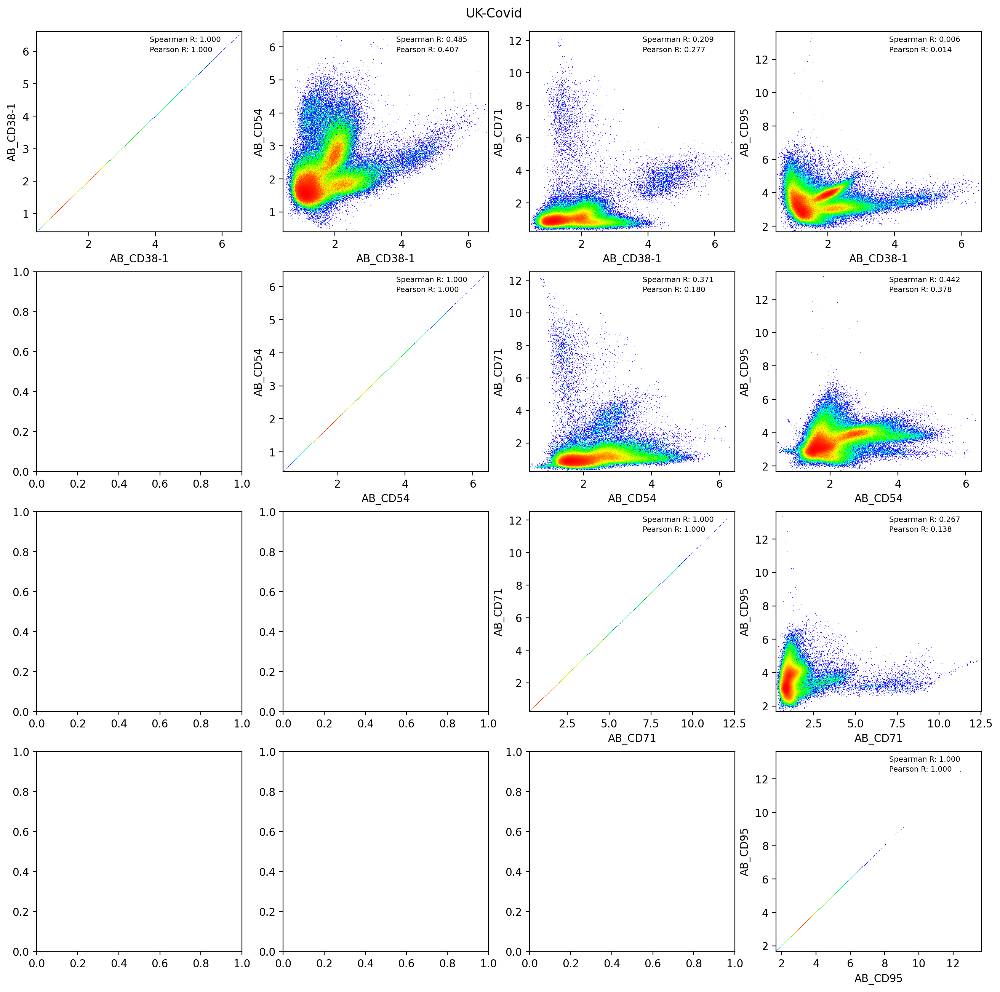

In [122]:
nrows = len(markers_magic.columns)
ncols = len(markers_magic.columns)
fig, axes = plt.subplots(dpi = 200, figsize = (4*len(markers_magic.columns), 4*len(markers_magic.columns)),
                                               nrows = nrows, ncols = ncols)

for i, p1 in enumerate(markers_magic.columns):
    print(i, p1)
    # i = i-1
    
    for j, p2 in enumerate(markers_magic.columns):
        # j = j-1
        if j >= i:
            print(j, p1)
            ax = axes[i, j]
            x = markers_magic[p1]
            y = markers_magic[p2]
            
            r_p, _ = pearsonr(x, y)
            r_s, _ = spearmanr(x, y)

            # ax.scatter(x, y)
            dsshow(pd.DataFrame({'x':x, 'y':y}), 
                   ds.Point('x', 'y'), norm='eq_hist', cmap=cmap, ax = ax, aspect = 'auto')
            # ax.scatter(x = x, y = y, s = 0.5, edgecolors='none',)
            ax.text(x = .55, y = .95, s = 'Spearman R: %.3f' % r_s, fontsize = 7, transform=ax.transAxes)
            ax.text(x = .55, y = .9, s = 'Pearson R: %.3f' % r_p, fontsize = 7, transform=ax.transAxes)
            ax.set_xlabel(p1)
            ax.set_ylabel(p2)
plt.suptitle(dataset,y = 0.9)

Text(0.5, 0.9, 'UK-Covid')

/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/datashader/mpl_ext.py:144: UserWarning: EqHistColorMapper warning: Histogram equalization did not converge.
  "EqHistColorMapper warning: Histogram equalization did not converge."
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/datashader/mpl_ext.py:144: UserWarning: EqHistColorMapper warning: Histogram equalization did not converge.
  "EqHistColorMapper warning: Histogram equalization did not converge."
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/datashader/mpl_ext.py:144: UserWarning: EqHistColorMapper warning: Histogram equalization did not converge.
  "EqHistColorMapper warning: Histogram equalization did not converge."


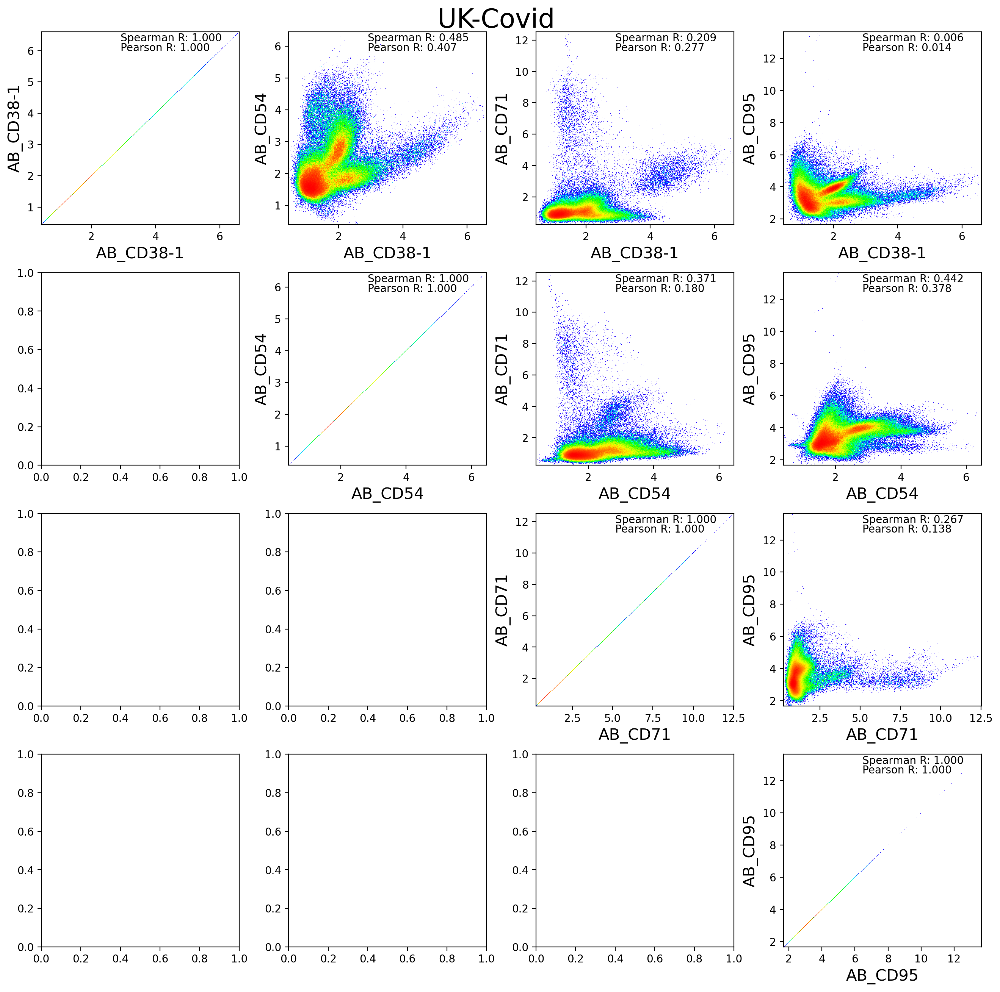

In [123]:
fontsize = 15
nrows = len(markers_magic.columns)
ncols = len(markers_magic.columns)
fig, axes = plt.subplots(dpi = 200, figsize = (4*len(markers_magic.columns), 4*len(markers_magic.columns)),
                                               nrows = nrows, ncols = ncols, 
                        gridspec_kw = {'wspace' : 0.25, 'hspace' : 0.25})

ind = markers_magic.index #lineage_gating[lineage_gating['class']==lineage].index
for i, p1 in enumerate(markers_magic.columns):
    # print(i, p1)
    # i = i-1

    for j, p2 in enumerate(markers_magic.columns):
        # j = j-1
        if j >= i:
            # print(j, p1)
            ax = axes[i, j]
            x = markers_magic.loc[ind, p1]
            y = markers_magic.loc[ind, p2]

            r_p, _ = pearsonr(x, y)
            r_s, _ = spearmanr(x, y)

            # ax.scatter(x, y)
            dsshow(pd.DataFrame({'x':x, 'y':y}), 
                   ds.Point('x', 'y'), norm='eq_hist', cmap=cmap, ax = ax, aspect = 'auto')
            # ax.scatter(x = x, y = y, s = 0.5, edgecolors='none',)
            ax.text(x = .4, y = .95, s = 'Spearman R: %.3f' % r_s, fontsize = 10, transform=ax.transAxes)
            ax.text(x = .4, y = .9, s = 'Pearson R: %.3f' % r_p, fontsize = 10, transform=ax.transAxes)
            ax.set_xlabel(p1, fontsize = fontsize)
            ax.set_ylabel(p2, fontsize = fontsize)
plt.suptitle('%s' % (dataset), y = 0.9, fontsize = fontsize + 10)

AB_CD38-1 AB_CD38-1
AB_CD38-1 AB_CD54
AB_CD38-1 AB_CD71
AB_CD38-1 AB_CD95
AB_CD54 AB_CD38-1
AB_CD54 AB_CD54
AB_CD54 AB_CD71
AB_CD54 AB_CD95
AB_CD71 AB_CD38-1
AB_CD71 AB_CD54
AB_CD71 AB_CD71
AB_CD71 AB_CD95
AB_CD95 AB_CD38-1
AB_CD95 AB_CD54
AB_CD95 AB_CD71
AB_CD95 AB_CD95


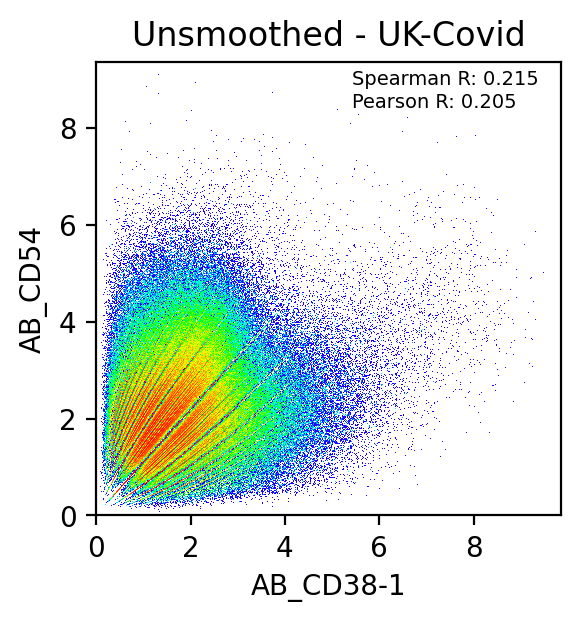

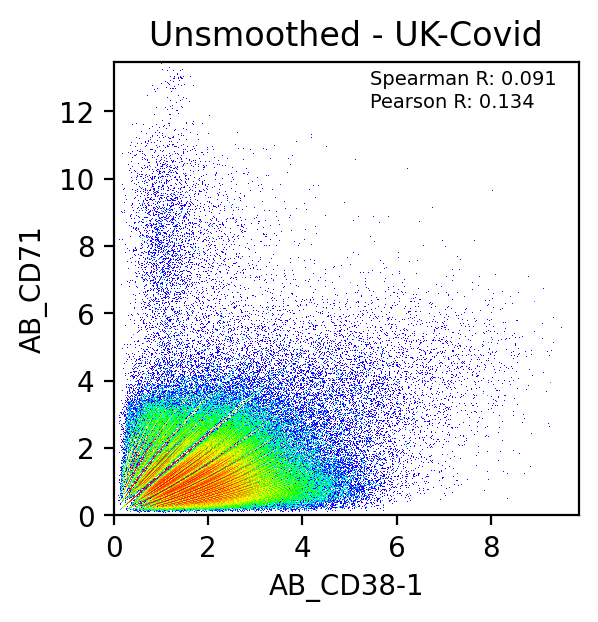

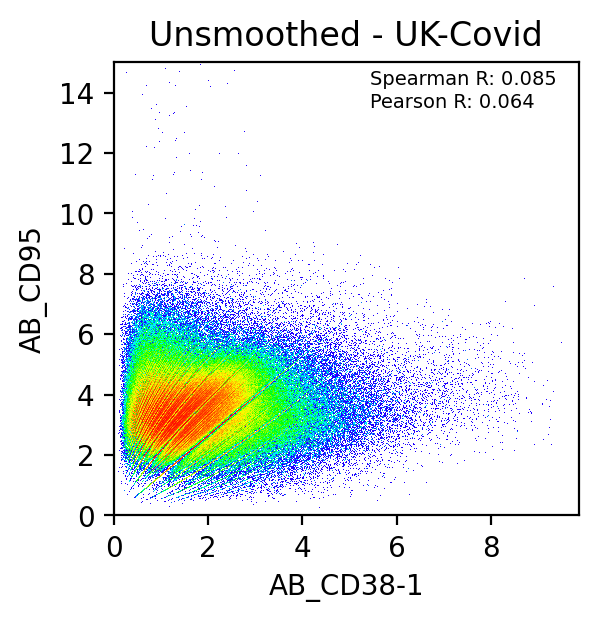

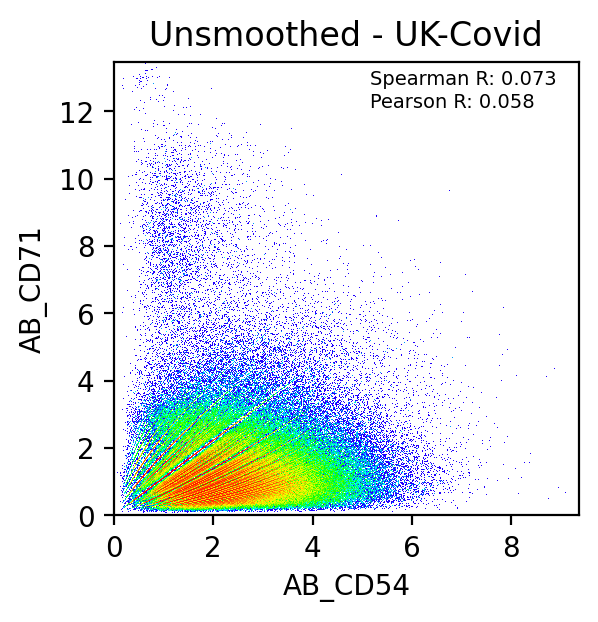

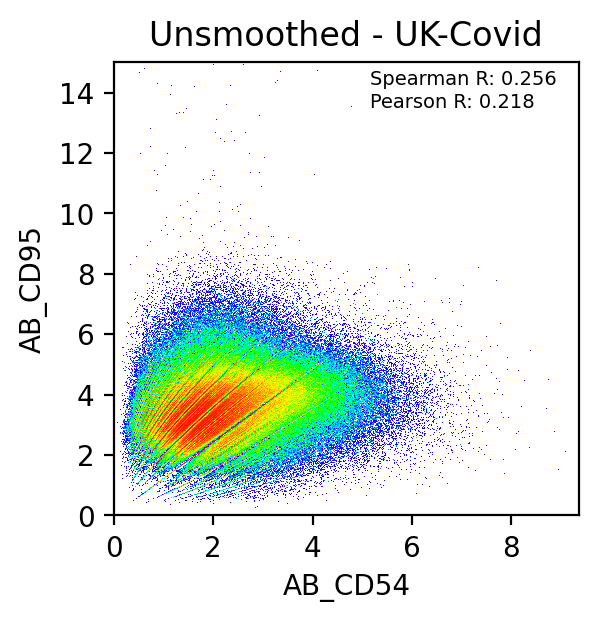

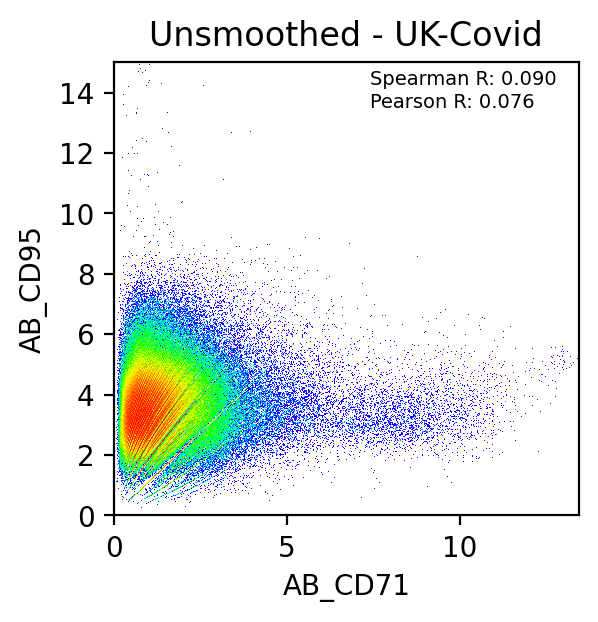

In [124]:
for i, p1 in enumerate(markers_magic.columns):
    
    for j, p2 in enumerate(markers_magic.columns):
        print(p1, p2)
        if j > i:
            x = unsmoothed_markers[p1]
            y = unsmoothed_markers[p2]
            
            r_p, _ = pearsonr(x, y)
            r_s, _ = spearmanr(x, y)

            fig, ax = plt.subplots(dpi = 200, figsize = (3, 3))
            # ax.scatter(x, y)
            dsshow(pd.DataFrame({'x':x, 'y':y}), 
                   ds.Point('x', 'y'), norm='eq_hist', cmap=cmap, ax = ax, aspect = 'auto')
            # ax.scatter(x = x, y = y, s = 0.5, edgecolors='none',)
            ax.text(x = .55, y = .95, s = 'Spearman R: %.3f' % r_s, fontsize = 7, transform=ax.transAxes)
            ax.text(x = .55, y = .9, s = 'Pearson R: %.3f' % r_p, fontsize = 7, transform=ax.transAxes)
            ax.set_xlabel(p1)
            ax.set_ylabel(p2)
            ax.set_title('Unsmoothed - %s' % dataset)

In [130]:
# cmap = plt.cm.hsv
# cmaplist = [cmap(i) for i in range(cmap.N)]
# cmaplist = cmaplist[0:round(len(cmaplist)*0.7)]
# cmaplist.reverse()
# cmap = matplotlib.colors.LinearSegmentedColormap.from_list('', cmaplist, cmap.N)
    
def gate(data, g1, g2, ind=None, vertical_gate=None, horizontal_gate=None, quadrant_gate=None,
         labfontsize=9, plot_labeled=False, upper_only=False, ax=None):
    
    
    if ax is None:
        fig = plt.figure(constrained_layout=True, figsize=(2., 2.), dpi=200)
        gs = gridspec.GridSpec(1, 1, figure=fig, left=0.2,
                       bottom=.2, right=.95, top=.92)
        ax = fig.add_subplot(gs[0])

    if ind  is None:
        ind = pd.Series(np.array([True]*data.shape[0]), data.index)
    
    
    x = data.loc[ind, g1]
    y = data.loc[ind, g2]
    
    dsshow(pd.DataFrame({'x':x, 'y':y}), ds.Point('x', 'y'), norm='eq_hist', cmap=cmap, ax = ax, aspect = 'auto')
    ax.set_xlabel(g1, fontsize=labfontsize)
    ax.set_ylabel(g2, fontsize=labfontsize)

    
    if vertical_gate is not None:
        xlim = ax.get_xlim()
        ax.hlines(y=vertical_gate['vthresh'], xmin=xlim[0], xmax=xlim[1], linestyle='--', color='k', linewidth=1)
        ax.set_xlim(xlim)
        
            
        initial_res = (data.loc[ind, g2]>vertical_gate['vthresh']).replace({True:vertical_gate['above_name'], False:vertical_gate['below_name']})
        final_res = ind.copy()
        final_res.loc[ind] = initial_res
        final_res.loc[~ind] = np.nan
    elif horizontal_gate is not None:
        ylim = ax.get_ylim()
        ax.vlines(x=horizontal_gate['hthresh'], ymin=ylim[0], ymax=ylim[1], linestyle='--', color='k', linewidth=1)
        ax.set_ylim(ylim)
        
        initial_res = (data.loc[ind, g1]>horizontal_gate['hthresh']).replace({False:horizontal_gate['left_name'], True:horizontal_gate['right_name']})
        final_res = ind.copy()
        final_res.loc[ind] = initial_res
        final_res.loc[~ind] = np.nan
        
        
    elif quadrant_gate is not None:
        xlim = ax.get_xlim()
        ylim = ax.get_ylim()
        if not upper_only:
            ax.hlines(y=quadrant_gate['vthresh'], xmin=xlim[0]-1, xmax=xlim[1]+1, linestyle='--', color='k', linewidth=1)
            ax.set_xlim(xlim)
            ax.vlines(x=quadrant_gate['hthresh'], ymin=ylim[0]-1, ymax=ylim[1]+1, linestyle='--', color='k', linewidth=1)
            ax.set_ylim(ylim)
        else:
            ax.hlines(y=quadrant_gate['vthresh'], xmin=quadrant_gate['hthresh'], xmax=xlim[1]+1, linestyle='--', color='k', linewidth=1)
            ax.set_xlim(xlim)
            ax.vlines(x=quadrant_gate['hthresh'], ymin=quadrant_gate['vthresh'], ymax=ylim[1]+1, linestyle='--', color='k', linewidth=1)
            ax.set_ylim(ylim)            
            

        indh = data.loc[ind, g1]> quadrant_gate['hthresh']
        indv = data.loc[ind, g2]> quadrant_gate['vthresh']
        final_res = ind.replace(False,np.nan)
        for hval,vval, lab in [[False, False, quadrant_gate['ll']], [True, False, quadrant_gate['lr']], [False, True, quadrant_gate['ul']], [True, True, quadrant_gate['ur']]]:
            tolab = (indh==hval) & (indv==vval)
            final_res.loc[tolab.index[tolab]] = lab
            
            
    if plot_labeled:
        fig = plt.figure(constrained_layout=True, figsize=(2.4, 2.), dpi=200)
        gs = gridspec.GridSpec(1, 1, figure=fig, left=0.2,
                       bottom=.2, right=.8, top=.92)
        ax2 = fig.add_subplot(gs[0])
        dat = pd.concat([x,y,final_res], axis=1)
        dat.columns = [g1, g2, 'label']
        for (k,g) in dat.groupby('label'):
            ax2.scatter(g[g1], g[g2], label=k, s=.5, edgecolor='None')
        ax2.legend(bbox_to_anchor=(1,1), markerscale=3, fontsize=6)
        
        
        
    return(final_res, ax)

In [131]:
gating = pd.DataFrame(index=markers_magic.index, columns=['Activated'])


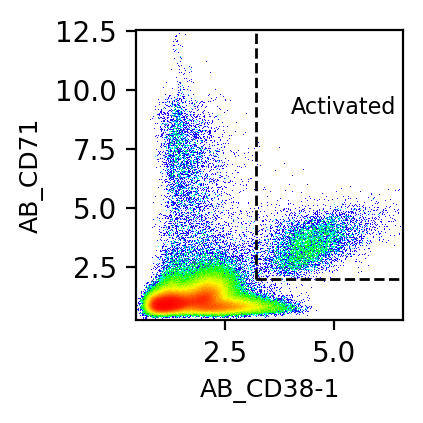

In [138]:
g1 = 'AB_CD38-1'
g2 = 'AB_CD71'   
gating['Activated'], ax = gate(markers_magic, g1, g2, #ind= ind,
                      quadrant_gate={'vthresh':2, 'hthresh':3.2, 'ur':'Activated', 'ul':'Unactivated', 'll':'Unactivated', 'lr':'Unactivated'}, 
                               plot_labeled=False, upper_only=True)
ax.text(4,9, 'Activated', fontsize=8)
# ax.set_title(lineage, fontsize=10)
plt.savefig(os.path.join(figdir, 'ManualGatingActivation_UKCovid_All.png'))
plt.savefig(os.path.join(figdir, 'ManualGatingActivation_UKCovid_All.pdf'))

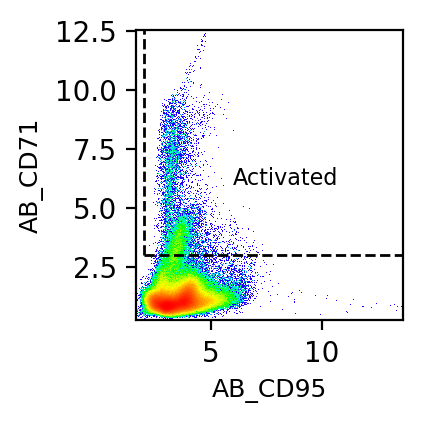

In [61]:
g1 = 'AB_CD95'
g2 = 'AB_CD71'   
gating['Activated'], ax = gate(markers_magic, g1, g2, #ind= ind,
                      quadrant_gate={'vthresh':3, 'hthresh':2., 'ur':'Activated', 'ul':'Unactivated', 'll':'Unactivated', 'lr':'Unactivated'}, 
                               plot_labeled=False, upper_only=True)
ax.text(6,6, 'Activated', fontsize=8)
# ax.set_title(lineage, fontsize=10)
# plt.savefig(os.path.join(figdir, 'ManualGatingActivation_UKCovid_All.png'))
# plt.savefig(os.path.join(figdir, 'ManualGatingActivation_UKCovid_All.pdf'))

In [62]:
gating

,Activated
covid_index,
AAACCTGAGAAACCTA-MH9179824,Unactivated
AAACCTGAGAGTAATC-MH9179824,Unactivated
AAACCTGAGAGTGAGA-MH9179824,Unactivated
AAACCTGAGGAATCGC-MH9179824,Unactivated
AAACCTGAGTGTTGAA-MH9179824,Unactivated
...,...
BGCV15_TTTGGTTTCAAGATCC-1,Unactivated
BGCV15_TTTGTCACAAGCCATT-1,Unactivated
BGCV15_TTTGTCACAGACACTT-1,Unactivated


In [139]:
gating['Activated'].value_counts()

Unactivated    605381
Activated        7601
Name: Activated, dtype: int64

In [140]:
!pwd

/data/srlab1/TCAT/Analysis/PerDataset/UKCOVID


In [141]:
outfn = os.path.join(outdir, 'ManualGatingActivation.Magic.20230111.tsv')
print(outfn)

../../../Data/PerDataset/UKCOVID/ManualGatingActivation.Magic.20230111.tsv


In [142]:
gating.to_csv(outfn, sep='\t')

## By lineage classes (CD4 Conv, CD4 Treg, CD8 Conv, Other)

In [29]:
lineage_gating = pd.read_csv(params.loc[dataset, 'manual_gating_fn'], index_col = 0, sep = '\t')
lineage_gating.columns = ['gating']

lineage_gating['class'] = np.nan
lineage_gating.loc[lineage_gating['gating'].str.contains('CD4'), 'class'] = 'CD4 Conv'
lineage_gating.loc[lineage_gating['gating']=='Treg', 'class'] = 'CD4 Treg'
lineage_gating.loc[lineage_gating['gating'].str.contains('CD8'), 'class'] = 'CD8 Conv'
lineage_gating.loc[lineage_gating['class'].isna(), 'class'] = 'Other'

In [30]:
lineage_gating.value_counts()

gating     class   
CD4_Naive  CD4 Conv    116069
CD4_CM     CD4 Conv     98734
CD4_EM     CD4 Conv     41164
CD8_TEMRA  CD8 Conv     36847
CD8_EM     CD8 Conv     33279
CD8_Naive  CD8 Conv     25526
DP         Other        13044
Treg       CD4 Treg     11798
CD8_CM     CD8 Conv      9706
gdT        Other         6204
MAIT       Other         6048
DN         Other         1386
CD4_TEMRA  CD4 Conv      1120
dtype: int64

In [31]:
lineage_gating['class'].value_counts()

CD4 Conv    257087
CD8 Conv    105358
Other        26682
CD4 Treg     11798
Name: class, dtype: int64

CD8 Conv
CD4 Conv
Other
CD4 Treg


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/datashader/mpl_ext.py:144: UserWarning: EqHistColorMapper warning: Histogram equalization did not converge.
  "EqHistColorMapper warning: Histogram equalization did not converge."
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/datashader/mpl_ext.py:144: UserWarning: EqHistColorMapper warning: Histogram equalization did not converge.
  "EqHistColorMapper warning: Histogram equalization did not converge."
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/datashader/mpl_ext.py:144: UserWarning: EqHistColorMapper warni

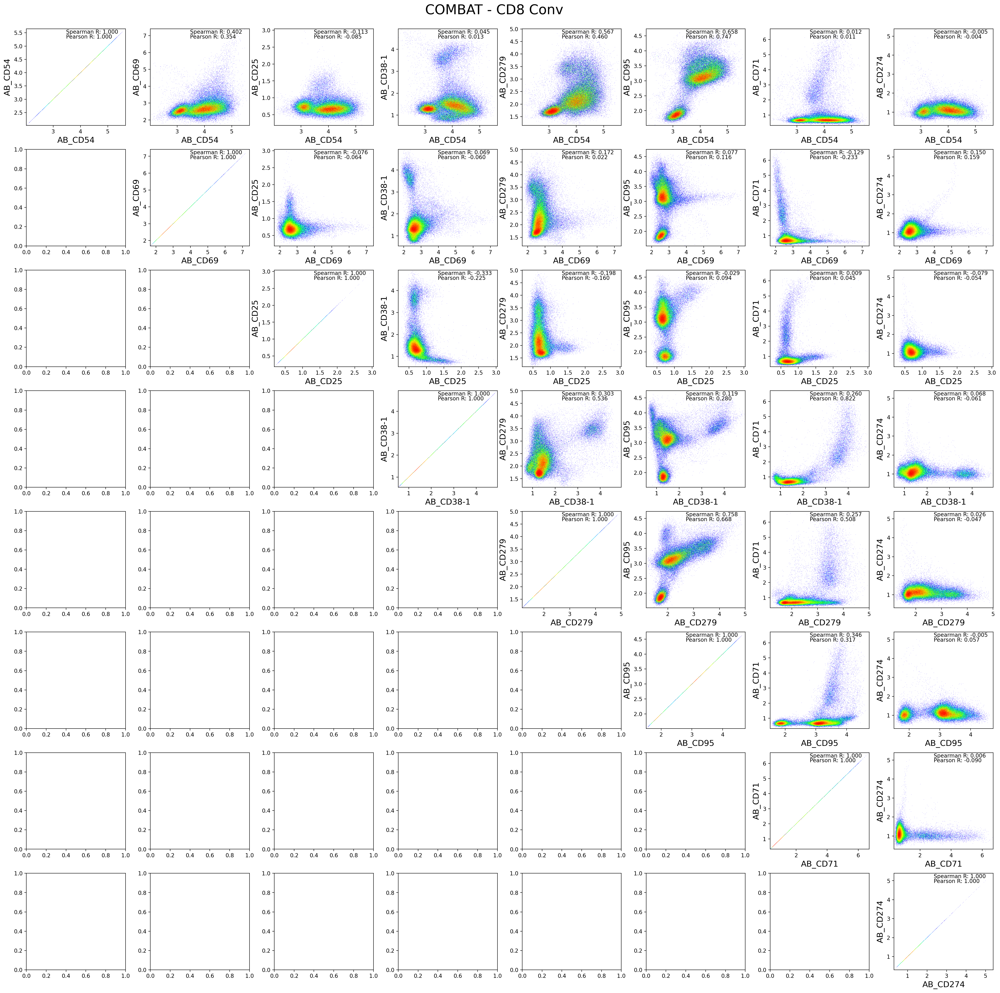

/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/datashader/mpl_ext.py:144: UserWarning: EqHistColorMapper warning: Histogram equalization did not converge.
  "EqHistColorMapper warning: Histogram equalization did not converge."
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/datashader/mpl_ext.py:144: UserWarning: EqHistColorMapper warning: Histogram equalization did not converge.
  "EqHistColorMapper warning: Histogram equalization did not converge."
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/datashader/mpl_ext.py:144: UserWarning: EqHistColorMapper warning: Histogram equalization did not converge.
  "EqHistColorMapper warning: Histogram equalization did not converge."
/PHShome/mc1070/anaconda3/envs/cnmf_env2v2/lib/python3.7/site-packages/datashader/mpl_ext.py:144: UserWarning: EqHistColorMapper warning: Histogram equalization did not converge.
  "EqHistColorMapper warning: Histogram equalization did not converg

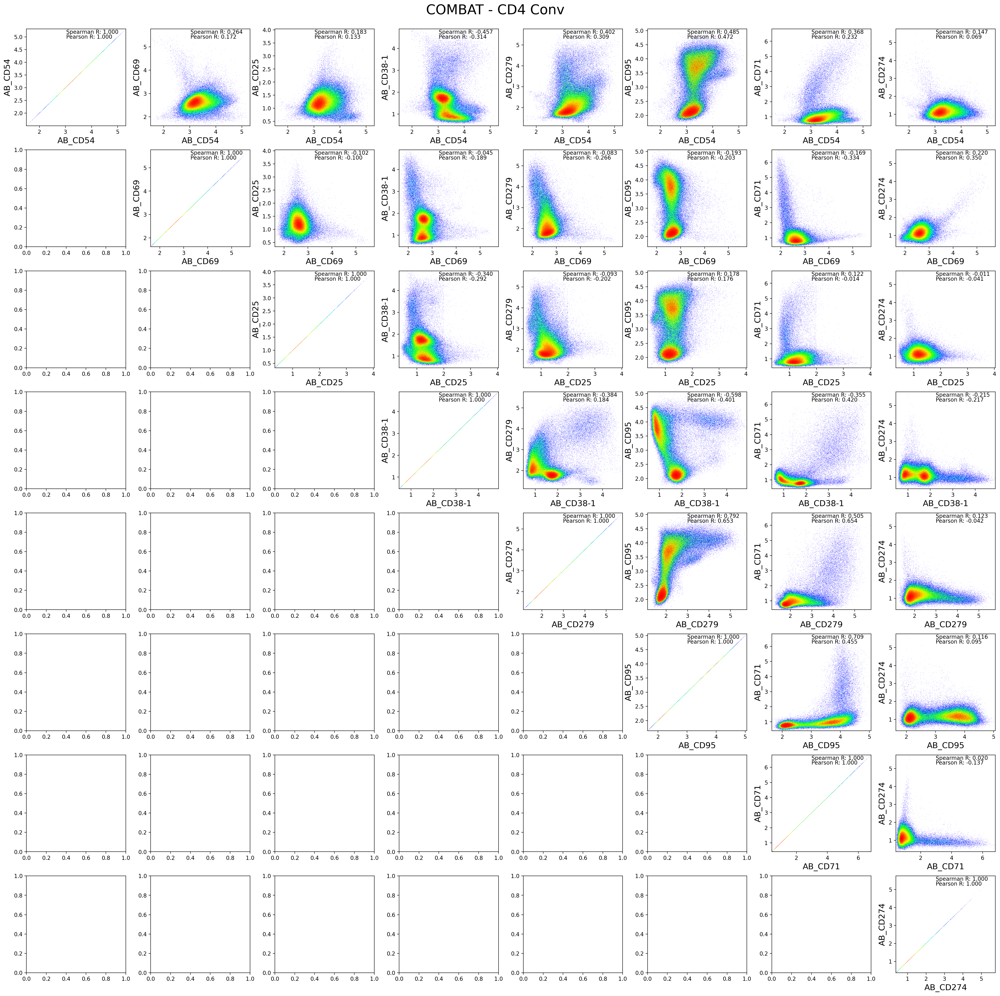

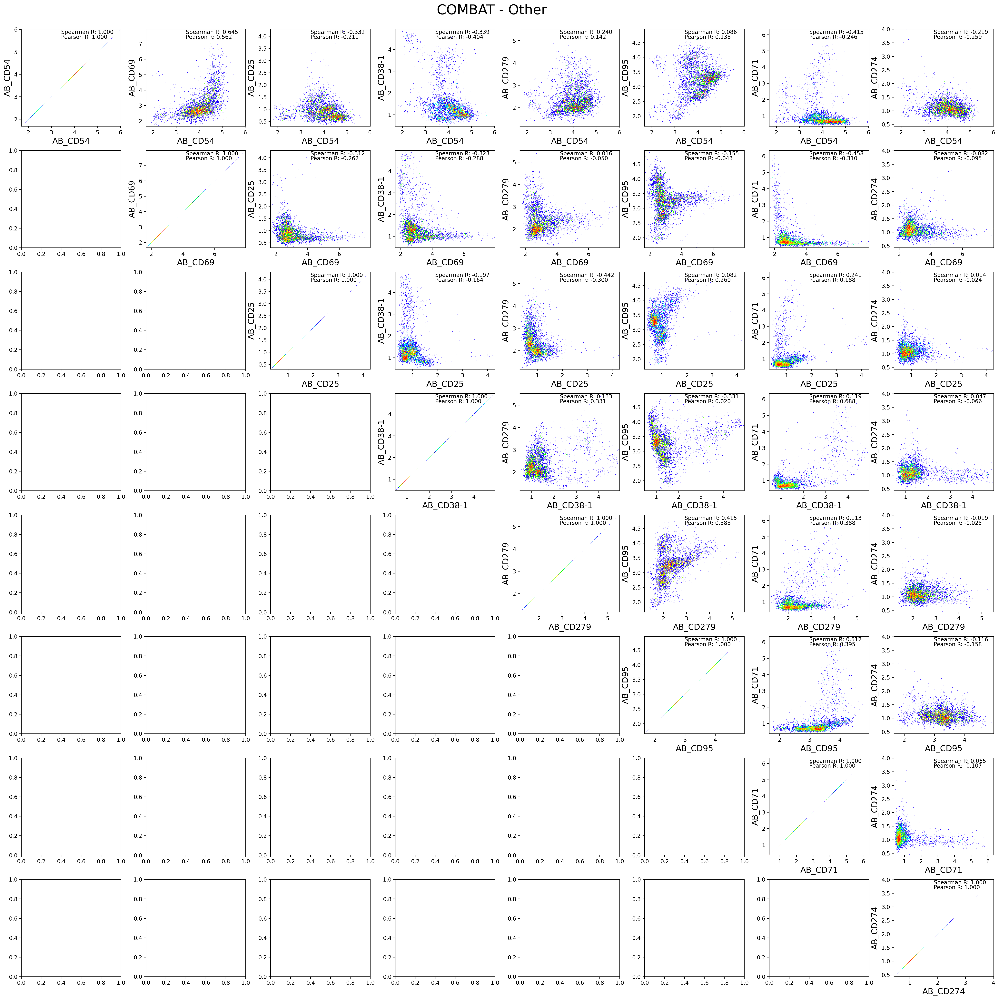

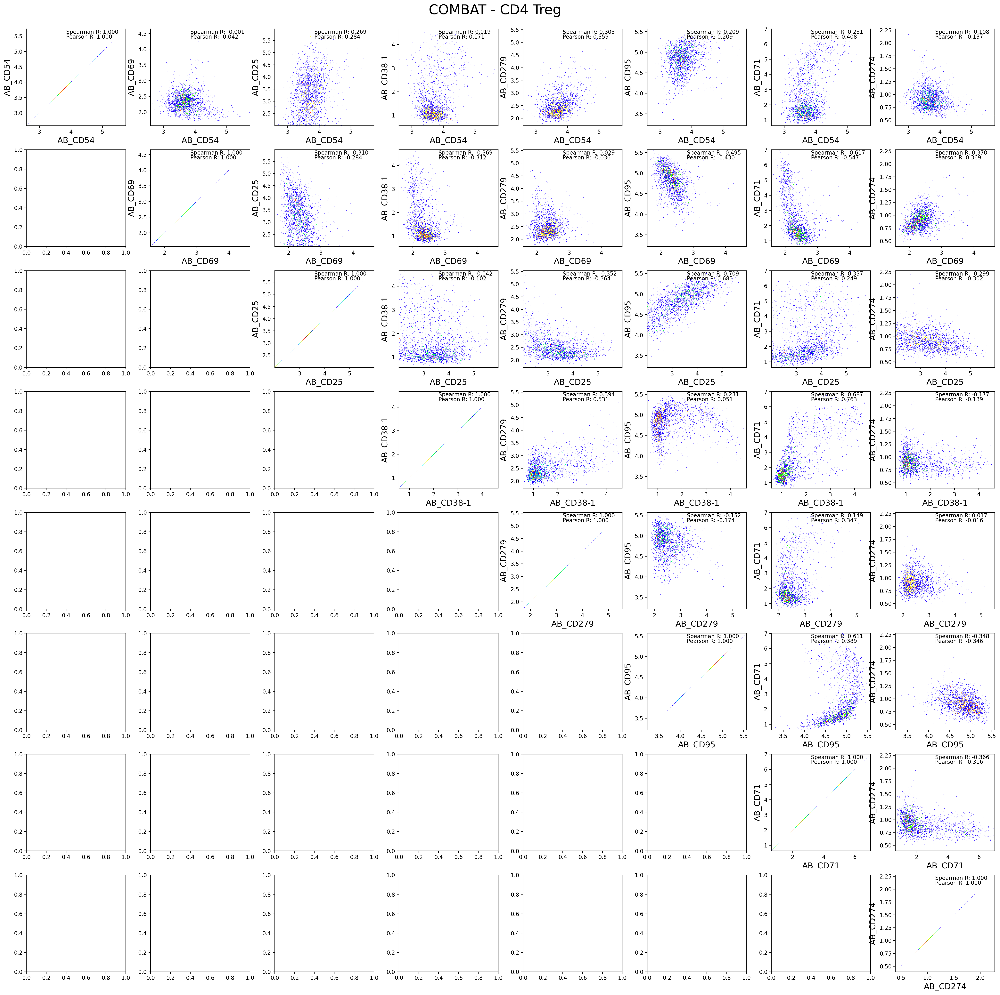

In [32]:
for lineage in lineage_gating['class'].unique():
    print(lineage)
    fontsize = 15
    nrows = len(markers_magic.columns)
    ncols = len(markers_magic.columns)
    fig, axes = plt.subplots(dpi = 200, figsize = (4*len(markers_magic.columns), 4*len(markers_magic.columns)),
                                                   nrows = nrows, ncols = ncols, 
                            gridspec_kw = {'wspace' : 0.25, 'hspace' : 0.25})
    
    ind = lineage_gating[lineage_gating['class']==lineage].index
    for i, p1 in enumerate(markers_magic.columns):
        # print(i, p1)
        # i = i-1

        for j, p2 in enumerate(markers_magic.columns):
            # j = j-1
            if j >= i:
                # print(j, p1)
                ax = axes[i, j]
                x = markers_magic.loc[ind, p1]
                y = markers_magic.loc[ind, p2]

                r_p, _ = pearsonr(x, y)
                r_s, _ = spearmanr(x, y)

                # ax.scatter(x, y)
                dsshow(pd.DataFrame({'x':x, 'y':y}), 
                       ds.Point('x', 'y'), norm='eq_hist', cmap=cmap, ax = ax, aspect = 'auto')
                # ax.scatter(x = x, y = y, s = 0.5, edgecolors='none',)
                ax.text(x = .4, y = .95, s = 'Spearman R: %.3f' % r_s, fontsize = 10, transform=ax.transAxes)
                ax.text(x = .4, y = .9, s = 'Pearson R: %.3f' % r_p, fontsize = 10, transform=ax.transAxes)
                ax.set_xlabel(p1, fontsize = fontsize)
                ax.set_ylabel(p2, fontsize = fontsize)
    plt.suptitle('%s - %s' % (dataset, lineage), y = 0.9, fontsize = fontsize + 10)